# Importing all the required libraries

In [57]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [58]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

#Importing nacc.csv file

In [59]:
nacc = pd.read_csv("/content/drive/MyDrive/investigator_nacc69.csv")

/tmp/ipython-input-3569946664.py:1: DtypeWarning: Columns (20,22,24,26,28,41,44,46,48,51,61,63,65,67,69,71,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,134,156,165,176,179,189,217,220,222,224,226,228,230,232,234,236,238,240,242,244,246,248,250,252,254,256,258,260,262,264,266,268,270,272,382,397,399,401,419,421,423,432,445,454,494,574,605,613,638,674,690,704,707,710,715,727,738,744,746,804,809,810,811,812,820,831,833,835,837,843,904,959,960,961,969,970,971,972,982,1004,1007,1010) have mixed types. Specify dtype option on import or set low_memory=False.
  nacc = pd.read_csv("/content/drive/MyDrive/investigator_nacc69.csv")


#Basic Quality Checks

In [60]:
nacc.head()

,NACCID,NACCADC,PACKET,FORMVER,VISITMO,VISITDAY,VISITYR,NACCVNUM,NACCAVST,NACCNVST,...,NPATGAM1,NPATGAM2,NPATGAM3,NPATGAM4,NPATGAM5,NPATGFRN,NPATGFR1,NPATGFR2,NPATGFR3,NPATGFR4
0,NACC002909,186,I,3.0,12,28,2022,1,2,2,...,-4,-4,-4,-4,-4,-4,-4,-4,-4,-4
1,NACC002909,186,F,3.0,1,23,2024,2,2,2,...,-4,-4,-4,-4,-4,-4,-4,-4,-4,-4
2,NACC003487,186,I,3.0,11,15,2023,1,1,1,...,-4,-4,-4,-4,-4,-4,-4,-4,-4,-4
3,NACC004352,186,I,3.0,10,5,2021,1,1,1,...,-4,-4,-4,-4,-4,-4,-4,-4,-4,-4
4,NACC004687,186,I,3.0,11,14,2022,1,2,2,...,-4,-4,-4,-4,-4,-4,-4,-4,-4,-4


In [61]:
# Set the option to display all rows
pd.set_option('display.max_rows', None)

# You can reset the option later if needed
# pd.reset_option('display.max_rows')

In [62]:
nacc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 201352 entries, 0 to 201351
Columns: 1024 entries, NACCID to NPATGFR4
dtypes: float64(143), int64(739), object(142)
memory usage: 1.5+ GB


In [63]:
nacc.describe()

,NACCADC,FORMVER,VISITMO,VISITDAY,VISITYR,NACCVNUM,NACCAVST,NACCNVST,NACCDAYS,NACCFDYS,...,NPATGAM1,NPATGAM2,NPATGAM3,NPATGAM4,NPATGAM5,NPATGFRN,NPATGFR1,NPATGFR2,NPATGFR3,NPATGFR4
count,201352.000000,201352.000000,201352.000000,201352.000000,201352.000000,201352.000000,201352.000000,201352.000000,201352.000000,201352.000000,...,201352.000000,201352.000000,201352.000000,201352.000000,201352.000000,201352.000000,201352.000000,201352.000000,201352.000000,201352.000000
mean,4987.293412,2.376063,6.393713,15.435998,2014.657778,3.851946,6.703892,5.824089,2468.306453,1219.594675,...,-3.903805,-3.901709,-3.906403,-3.902206,-3.905186,-3.883825,-3.965419,-3.963899,-3.965016,-3.966194
std,2987.347193,0.696965,3.388243,8.609174,5.491822,3.147028,4.327328,4.016413,1816.010436,1327.853096,...,0.790323,0.820071,0.781629,0.809371,0.783408,0.863019,0.484034,0.497615,0.483989,0.479284
min,186.000000,1.000000,1.000000,1.000000,2005.000000,1.000000,1.000000,1.000000,0.000000,0.000000,...,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000
25%,2289.000000,2.000000,3.000000,8.000000,2010.000000,1.000000,3.000000,3.000000,1014.000000,0.000000,...,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000
50%,4967.000000,2.000000,6.000000,15.000000,2014.000000,3.000000,6.000000,5.000000,2177.000000,784.000000,...,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000
75%,8361.000000,3.000000,9.000000,23.000000,2019.000000,5.000000,10.000000,8.000000,3711.000000,1855.000000,...,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000
max,9661.000000,3.200000,12.000000,31.000000,2025.000000,20.000000,20.000000,20.000000,7020.000000,7020.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000


#Creating copy of original file. all changes/modifications will executed on this file.

In [64]:
nacc_copy = nacc.copy()

print("Copies created:")
print(f"- nacc_copy: {len(nacc_copy)} rows")

Copies created:
- nacc_copy: 201352 rows


# **Cleaning the nacc_copy file**


#Check for dupliated values and delete them

In [65]:
nacc_copy = nacc_copy.drop_duplicates()

In [66]:
nacc_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 201352 entries, 0 to 201351
Columns: 1024 entries, NACCID to NPATGFR4
dtypes: float64(143), int64(739), object(142)
memory usage: 1.5+ GB


No duplicates in NACC data

# Keep only those participants who have visited the hospital at least twice.

In [67]:
# Count the occurrences of each NACCID in nacc_copy
naccid_counts = nacc_copy['NACCID'].value_counts()

# Identify NACCIDs that occur only once
naccids_to_remove = naccid_counts[naccid_counts == 1].index

# Remove rows from nacc_copy where NACCID is in the list of NACCIDs to remove
nacc_copy = nacc_copy[~nacc_copy['NACCID'].isin(naccids_to_remove)].copy()

# Display the info of the modified DataFrame to confirm the number of rows
print("Info of nacc_copy after removing single-visit NACCIDs:")
nacc_copy.info()

Info of nacc_copy after removing single-visit NACCIDs:
<class 'pandas.core.frame.DataFrame'>
Index: 184092 entries, 0 to 201350
Columns: 1024 entries, NACCID to NPATGFR4
dtypes: float64(143), int64(739), object(142)
memory usage: 1.4+ GB


In [68]:
'''
This is just for my reference

HIPPOCAMPUS (total hippocampus volume)

(LH_ENTORHINAL_AVGTH + RH_ENTORHINAL_AVGTH)/2

Age, sex, education

APOE (how many e4 allele present) (NACCNE4S)

Family history of cognitive impairment (NACCFAM)

Baseline diagnosis of MCI

Depression score (NACCGDS & DEP2YRS)

MMSE score  (NACCMMSE)

CRAFTVRS, CRAFTDVR, DIGFORCT, DIGBACCT

Nacc69 and mrisbm
'''

'\nThis is just for my reference\n\nHIPPOCAMPUS (total hippocampus volume)\n\n(LH_ENTORHINAL_AVGTH + RH_ENTORHINAL_AVGTH)/2\n\nAge, sex, education\n\nAPOE (how many e4 allele present) (NACCNE4S)\n\nFamily history of cognitive impairment (NACCFAM)\n\nBaseline diagnosis of MCI\n\nDepression score (NACCGDS & DEP2YRS)\n\nMMSE score  (NACCMMSE)\n\nCRAFTVRS, CRAFTDVR, DIGFORCT, DIGBACCT\n\nNacc69 and mrisbm\n'

# Calculation of Age

birth month and year are already given. birth day is assumed to be 1st of the birth month.

In [69]:
# Convert date columns to datetime objects using only year and month for birth date
nacc_copy['birth_date'] = pd.to_datetime(nacc_copy['BIRTHYR'].astype(str) + '-' + nacc_copy['BIRTHMO'].astype(str), errors='coerce')
nacc_copy['visit_date'] = pd.to_datetime(nacc_copy['VISITYR'].astype(str) + '-' + nacc_copy['VISITMO'].astype(str) + '-' + nacc_copy['VISITDAY'].astype(str), errors='coerce')

# Calculate age
nacc_copy['Age'] = (nacc_copy['visit_date'] - nacc_copy['birth_date']).dt.days / 365.25

# Format dates to 'day-month-year'
nacc_copy['birth_date_formatted'] = nacc_copy['birth_date'].dt.strftime('%d-%m-%Y')
nacc_copy['visit_date_formatted'] = nacc_copy['visit_date'].dt.strftime('%d-%m-%Y')


# Display the first few rows with the new 'Age' column and formatted dates
display(nacc_copy[['BIRTHYR', 'BIRTHMO', 'VISITYR', 'VISITMO', 'VISITDAY', 'birth_date_formatted', 'visit_date_formatted', 'Age']].head())

,BIRTHYR,BIRTHMO,VISITYR,VISITMO,VISITDAY,birth_date_formatted,visit_date_formatted,Age
0,1952,5,2022,12,28,01-05-1952,28-12-2022,70.658453
1,1952,5,2024,1,23,01-05-1952,23-01-2024,71.728953
4,1942,8,2022,11,14,01-08-1942,14-11-2022,80.287474
5,1942,8,2024,9,4,01-08-1942,04-09-2024,82.094456
7,1936,7,2022,11,15,01-07-1936,15-11-2022,86.373717


In [70]:
# Count the number of rows where 'NACCUDSD' is 4
naccudsd_4_naccalzd_1_count = nacc_copy[((nacc_copy['NACCUDSD'] == 4) & (nacc_copy['NACCALZD'] == 1))].shape[0]

print(f"The number of rows where NACCUDSD is 4 in nacc_copy is: {naccudsd_4_naccalzd_1_count}")

The number of rows where NACCUDSD is 4 in nacc_copy is: 42043


# Applying conditions based on NACCUDSD:

1. Extract only rows having NACCUDSD equal 3 or 4
2. Deleting the rows having NACCUDSD equal 4 and NACCALZD not equal to 1.
3. keeping the rows have NACCUDSD only 3 or converted from 3 to 4.

In [71]:
# Condition 1: Filter rows where NACCUDSD is either 3 or 4.
nacc_copy = nacc_copy[nacc_copy['NACCUDSD'].isin([3, 4])].copy()

# Condition 2: Remove rows where NACCUDSD is 4 and NACCALZD is not equal to 1.
nacc_copy = nacc_copy[~((nacc_copy['NACCUDSD'] == 4) & (nacc_copy['NACCALZD'] != 1))].copy()

# Condition 3: For rows where NACCUDSD is 4, check if there exists at least one other row with the same NACCID where NACCUDSD is 3.
# If no such row exists for that NACCID, delete the row with NACCUDSD equal to 4.

# Identify NACCIDs that have at least one row with NACCUDSD == 3
naccid_with_naccudsd_3 = nacc_copy[nacc_copy['NACCUDSD'] == 3]['NACCID'].unique()

# Create a condition for rows to keep:
# Either NACCUDSD is 3 OR (NACCUDSD is 4 AND the NACCID is in the list of NACCIDs with NACCUDSD == 3)
condition_naccudsd_4_with_3 = (nacc_copy['NACCUDSD'] == 3) | \
                              ((nacc_copy['NACCUDSD'] == 4) & (nacc_copy['NACCID'].isin(naccid_with_naccudsd_3)))

nacc_copy = nacc_copy[condition_naccudsd_4_with_3].copy()

# Extracting only the essential features:

In [72]:
# List of desired columns
desired_columns_nacc = ['NACCID', 'visit_date', 'Age', 'SEX', 'EDUC', 'NACCNE4S', 'NACCFAM', 'NACCGDS', 'DEP2YRS', 'NACCMMSE', 'CRAFTVRS', 'CRAFTDVR', 'DIGFORCT', 'DIGBACCT', 'NACCUDSD', 'ANIMALS', 'TRAILA', 'TRAILB', 'NACCALZD', 'NACCBMI']

# Select the desired columns from nacc_copy
nacc_copy = nacc_copy[desired_columns_nacc].copy()

# Display the first few rows of the updated nacc_copy
print("nacc_copy with selected columns:")
display(nacc_copy.head())

# Display the info to confirm the columns
print("\nInfo of nacc_copy after selecting columns:")
nacc_copy.info()

# Columns found in nacc_copy: ['NACCID', 'visit_date', 'Age', 'SEX', 'EDUC', 'NACCNE4S', 'NACCFAM', 'NACCGDS', 'DEP2YRS', 'NACCMMSE', 'CRAFTVRS', 'CRAFTDVR', 'DIGFORCT', 'DIGBACCT', 'NACCUDSD', 'ANIMALS', 'TRAILA', 'TRAILB', 'NACCALZD']

nacc_copy with selected columns:


,NACCID,visit_date,Age,SEX,EDUC,NACCNE4S,NACCFAM,NACCGDS,DEP2YRS,NACCMMSE,CRAFTVRS,CRAFTDVR,DIGFORCT,DIGBACCT,NACCUDSD,ANIMALS,TRAILA,TRAILB,NACCALZD,NACCBMI
0,NACC002909,2022-12-28,70.658453,1,16,1.0,1,4,0,-4,18,10,8,5,3,13,51,87,1,32.4
1,NACC002909,2024-01-23,71.728953,1,16,1.0,1,1,-4,-4,19,0,9,7,3,21,31,83,1,30.7
44,NACC063570,2022-08-02,82.584531,1,14,0.0,0,4,0,-4,12,8,9,4,3,17,45,213,0,28.4
45,NACC063570,2023-08-09,83.603012,1,14,0.0,0,2,-4,-4,8,7,7,5,3,18,55,300,0,29.0
46,NACC063570,2024-08-27,84.654346,1,14,0.0,0,1,-4,-4,12,9,7,6,3,17,41,300,0,25.0



Info of nacc_copy after selecting columns:
<class 'pandas.core.frame.DataFrame'>
Index: 42339 entries, 0 to 201350
Data columns (total 20 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   NACCID      42339 non-null  object        
 1   visit_date  42339 non-null  datetime64[ns]
 2   Age         42339 non-null  float64       
 3   SEX         42339 non-null  int64         
 4   EDUC        42339 non-null  int64         
 5   NACCNE4S    42179 non-null  float64       
 6   NACCFAM     42339 non-null  int64         
 7   NACCGDS     42339 non-null  int64         
 8   DEP2YRS     42339 non-null  int64         
 9   NACCMMSE    42339 non-null  int64         
 10  CRAFTVRS    42339 non-null  int64         
 11  CRAFTDVR    42339 non-null  int64         
 12  DIGFORCT    42339 non-null  int64         
 13  DIGBACCT    42339 non-null  int64         
 14  NACCUDSD    42339 non-null  int64         
 15  ANIMALS     42339 non-null  in

In [73]:
# # Count the number of rows where 'NACCUDSD' is 4
# naccudsd_4_naccalzd_1_count = nacc_copy[((nacc_copy['NACCUDSD'] == 4) & (nacc_copy['NACCALZD'] == 1))].shape[0]

# print(f"The number of rows where NACCUDSD is 4 in nacc_copy is: {naccudsd_4_naccalzd_1_count}")

In [74]:
nacc_copy_2 = nacc_copy.copy()

print("Updated copies created:")
print(f"- nacc_copy_2: {len(nacc_copy_2.columns)} columns")

Updated copies created:
- nacc_copy_2: 20 columns


In [75]:
# nacc_unique = nacc_copy_2['NACCID'].nunique()
# print("\nNumber of unique NACCIDs in nacc_copy_2:")
# nacc_unique


# creating new feature named "time (days)"



In [76]:
# changes i need to make:
#for UDSD == 4 : difference between first occurance for udsd 4 and first occurance for udsd 3
# for UDSD == 3 only : difference between last occurance first occurance for udsd 3
# update dates in the first occurance of NACCID.


# # Add a new column 'time (days)' to nacc_copy_2 and initialize with NaN
# nacc_copy_2['time (days)'] = np.nan

# # Convert 'visit_date' in nacc_copy_2 to datetime objects if not already
# nacc_copy_2['visit_date'] = pd.to_datetime(nacc_copy_2['visit_date'])

# # Convert 'SCANDT' in mrisbm_copy_2 to datetime objects if not already
# mrisbm_copy_2['SCANDT'] = pd.to_datetime(mrisbm_copy_2['SCANDT'])

# # Iterate through each unique NACCID in nacc_copy_2
# for naccid in nacc_copy_2['NACCID'].unique():
#     # Get rows for the current NACCID in both DataFrames
#     nacc_rows = nacc_copy_2[nacc_copy_2['NACCID'] == naccid].sort_values(by='visit_date')
#     mrisbm_row = mrisbm_copy_2[mrisbm_copy_2['NACCID'] == naccid]

#     # Check if there is a corresponding row in mrisbm_copy_2
#     if not mrisbm_row.empty:
#         scandt_mri = mrisbm_row.iloc[0]['SCANDT']

#         # Condition 1: NACCID has at least one row with NACCUDSD == 4
#         nacc_udsd_4_rows = nacc_rows[nacc_rows['NACCUDSD'] == 4]
#         if not nacc_udsd_4_rows.empty:
#             # Use the visit_date from the first occurrence of NACCUDSD == 4
#             visit_date_nacc = nacc_udsd_4_rows.iloc[0]['visit_date']
#             time_difference = (scandt_mri - visit_date_nacc).days

#             # Find the index of the first occurrence of this NACCID in nacc_copy_2
#             first_occurrence_index = nacc_copy_2[nacc_copy_2['NACCID'] == naccid].index[0]

#             # Update the 'time (days)' column in the first occurrence row with the absolute difference
#             nacc_copy_2.loc[first_occurrence_index, 'time (days)'] = abs(time_difference)

#         else:
#             # Condition 2: NACCID has only NACCUDSD == 3 across all its rows
#             # Use the visit_date from the last occurrence of this NACCID
#             visit_date_nacc = nacc_rows.iloc[-1]['visit_date']
#             time_difference = (scandt_mri - visit_date_nacc).days

#             # Find the index of the first occurrence of this NACCID in nacc_copy_2
#             first_occurrence_index = nacc_copy_2[nacc_copy_2['NACCID'] == naccid].index[0]

#             # Update the 'time (days)' column in the first occurrence row with the absolute difference
#             nacc_copy_2.loc[first_occurrence_index, 'time (days)'] = abs(time_difference)

# # Display the first few rows of nacc_copy_2 with the new column
# print("nacc_copy_2 with 'time (days)' column:")
# display(nacc_copy_2.head())

# # Display the info of nacc_copy_2 to check the new column
# print("\nInfo of nacc_copy_2:")
# nacc_copy_2.info()

In [77]:
# # Add a new column 'time (days)' to nacc_copy_2 and initialize with NaN
# nacc_copy_2['time (days)'] = np.nan

# # Convert 'visit_date' to datetime objects
# nacc_copy_2['visit_date'] = pd.to_datetime(nacc_copy_2['visit_date'])

# # Iterate through each unique NACCID in nacc_copy_2
# for naccid in nacc_copy_2['NACCID'].unique():
#     # Get rows for the current NACCID and sort by visit_date
#     nacc_rows = nacc_copy_2[nacc_copy_2['NACCID'] == naccid].sort_values(by='visit_date')

#     # Find the first occurrence of NACCUDSD == 3
#     first_udsd3_date = nacc_rows[nacc_rows['NACCUDSD'] == 3]['visit_date'].min()

#     # Find the first occurrence of NACCUDSD == 4
#     first_udsd4_date = nacc_rows[nacc_rows['NACCUDSD'] == 4]['visit_date'].min()

#     # Find the last occurrence of NACCUDSD == 3
#     last_udsd3_date = nacc_rows[nacc_rows['NACCUDSD'] == 3]['visit_date'].max()

#     # Condition 1: NACCID has at least one row with NACCUDSD == 4
#     if not pd.isna(first_udsd4_date):
#         # Calculate the difference between the first NACCUDSD == 4 and first NACCUDSD == 3 dates
#         time_difference = (first_udsd4_date - first_udsd3_date).days

#         # Find the index of the first occurrence of this NACCID
#         first_occurrence_index = nacc_copy_2[nacc_copy_2['NACCID'] == naccid].index[0]

#         # Update the 'time (days)' column in the first occurrence row
#         nacc_copy_2.loc[first_occurrence_index, 'time (days)'] = time_difference

#     # Condition 2: NACCID has only NACCUDSD == 3 across all its rows
#     elif not pd.isna(first_udsd3_date):
#         # Calculate the difference between the last and first NACCUDSD == 3 dates
#         time_difference = (last_udsd3_date - first_udsd3_date).days

#         # Find the index of the first occurrence of this NACCID
#         first_occurrence_index = nacc_copy_2[nacc_copy_2['NACCID'] == naccid].index[0]

#         # Update the 'time (days)' column in the first occurrence row
#         nacc_copy_2.loc[first_occurrence_index, 'time (days)'] = time_difference


# # Display the first few rows of nacc_copy_2 with the new column
# print("nacc_copy_2 with 'time (days)' column:")
# display(nacc_copy_2.head())

# # Display the info of nacc_copy_2 to check the new column
# print("\nInfo of nacc_copy_2:")
# nacc_copy_2.info()

# # # Display the value counts of the 'time (days)' column to see how many values were filled
# # print("\nValue counts for the 'time (days)' column:")
# # display(nacc_copy_2['time (days)'].value_counts(dropna=False))

In [78]:
# Add a new column 'time (days)' to nacc_copy_2 and initialize with NaN
nacc_copy_2['time (days)'] = np.nan

# Convert 'visit_date' to datetime objects if not already
nacc_copy_2['visit_date'] = pd.to_datetime(nacc_copy_2['visit_date'])

# Iterate through each unique NACCID in nacc_copy_2
for naccid in nacc_copy_2['NACCID'].unique():
    # Get rows for the current NACCID and sort by visit_date
    nacc_rows = nacc_copy_2[nacc_copy_2['NACCID'] == naccid].sort_values(by='visit_date')

    # Find the first occurrence of NACCUDSD == 3
    first_udsd3_date = nacc_rows[nacc_rows['NACCUDSD'] == 3]['visit_date'].min()

    # Find the first occurrence of NACCUDSD == 4
    first_udsd4_date = nacc_rows[nacc_rows['NACCUDSD'] == 4]['visit_date'].min()

    # Find the last occurrence of NACCUDSD == 3
    last_udsd3_date = nacc_rows[nacc_rows['NACCUDSD'] == 3]['visit_date'].max()

    # Condition 1: NACCID has at least one row with NACCUDSD == 4
    if pd.notna(first_udsd4_date):
        # Calculate the difference between the first NACCUDSD == 4 and first NACCUDSD == 3 dates
        # Ensure first_udsd3_date is not NaN before calculating difference
        if pd.notna(first_udsd3_date):
            time_difference = abs((first_udsd4_date - first_udsd3_date).days)

            # Find the index of the first occurrence of this NACCID
            first_occurrence_index = nacc_copy_2[nacc_copy_2['NACCID'] == naccid].index[0]

            # Update the 'time (days)' column in the first occurrence row
            nacc_copy_2.loc[first_occurrence_index, 'time (days)'] = time_difference

    # Condition 2: NACCID has only NACCUDSD == 3 across all its rows
    elif pd.notna(first_udsd3_date):
        # Calculate the difference between the last and first NACCUDSD == 3 dates
        time_difference = abs((last_udsd3_date - first_udsd3_date).days)

        # Find the index of the first occurrence of this NACCID
        first_occurrence_index = nacc_copy_2[nacc_copy_2['NACCID'] == naccid].index[0]

        # Update the 'time (days)' column in the first occurrence row
        nacc_copy_2.loc[first_occurrence_index, 'time (days)'] = time_difference

# Display the first few rows of nacc_copy_2 with the new column
print("nacc_copy_2 with 'time (days)' column:")
display(nacc_copy_2.head())

# Display the info of nacc_copy_2 to check the new column
print("\nInfo of nacc_copy_2:")
nacc_copy_2.info()

# # Display the value counts of the 'time (days)' column to see how many values were filled
# print("\nValue counts for the 'time (days)' column:")
# display(nacc_copy_2['time (days)'].value_counts(dropna=False))

nacc_copy_2 with 'time (days)' column:


,NACCID,visit_date,Age,SEX,EDUC,NACCNE4S,NACCFAM,NACCGDS,DEP2YRS,NACCMMSE,...,CRAFTDVR,DIGFORCT,DIGBACCT,NACCUDSD,ANIMALS,TRAILA,TRAILB,NACCALZD,NACCBMI,time (days)
0,NACC002909,2022-12-28,70.658453,1,16,1.0,1,4,0,-4,...,10,8,5,3,13,51,87,1,32.4,391.0
1,NACC002909,2024-01-23,71.728953,1,16,1.0,1,1,-4,-4,...,0,9,7,3,21,31,83,1,30.7,NaN
44,NACC063570,2022-08-02,82.584531,1,14,0.0,0,4,0,-4,...,8,9,4,3,17,45,213,0,28.4,756.0
45,NACC063570,2023-08-09,83.603012,1,14,0.0,0,2,-4,-4,...,7,7,5,3,18,55,300,0,29.0,NaN
46,NACC063570,2024-08-27,84.654346,1,14,0.0,0,1,-4,-4,...,9,7,6,3,17,41,300,0,25.0,NaN



Info of nacc_copy_2:
<class 'pandas.core.frame.DataFrame'>
Index: 42339 entries, 0 to 201350
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   NACCID       42339 non-null  object        
 1   visit_date   42339 non-null  datetime64[ns]
 2   Age          42339 non-null  float64       
 3   SEX          42339 non-null  int64         
 4   EDUC         42339 non-null  int64         
 5   NACCNE4S     42179 non-null  float64       
 6   NACCFAM      42339 non-null  int64         
 7   NACCGDS      42339 non-null  int64         
 8   DEP2YRS      42339 non-null  int64         
 9   NACCMMSE     42339 non-null  int64         
 10  CRAFTVRS     42339 non-null  int64         
 11  CRAFTDVR     42339 non-null  int64         
 12  DIGFORCT     42339 non-null  int64         
 13  DIGBACCT     42339 non-null  int64         
 14  NACCUDSD     42339 non-null  int64         
 15  ANIMALS      42339 non-null  int64 

# creating new column "event" based on NACCUDSD

In [79]:
# Initialize the 'event' column with 0
nacc_copy_2['event'] = 0

# Iterate through each unique NACCID
for naccid in nacc_copy_2['NACCID'].unique():
    # Get all rows for the current NACCID
    nacc_rows = nacc_copy_2[nacc_copy_2['NACCID'] == naccid]

    # Check if NACCUDSD changes from 3 to 4
    if (nacc_rows['NACCUDSD'] == 3).any() and (nacc_rows['NACCUDSD'] == 4).any():
        # If the condition is met, set 'event' to 1 for all rows of this NACCID
        nacc_copy_2.loc[nacc_rows.index, 'event'] = 1

# Display the first few rows with the new 'event' column
print("nacc_copy_2 with 'event' column:")
display(nacc_copy_2.head())

# Display the value counts for the 'event' column
print("\nValue counts for the 'event' column:")
display(nacc_copy_2['event'].value_counts())

nacc_copy_2 with 'event' column:


,NACCID,visit_date,Age,SEX,EDUC,NACCNE4S,NACCFAM,NACCGDS,DEP2YRS,NACCMMSE,...,DIGFORCT,DIGBACCT,NACCUDSD,ANIMALS,TRAILA,TRAILB,NACCALZD,NACCBMI,time (days),event
0,NACC002909,2022-12-28,70.658453,1,16,1.0,1,4,0,-4,...,8,5,3,13,51,87,1,32.4,391.0,0
1,NACC002909,2024-01-23,71.728953,1,16,1.0,1,1,-4,-4,...,9,7,3,21,31,83,1,30.7,NaN,0
44,NACC063570,2022-08-02,82.584531,1,14,0.0,0,4,0,-4,...,9,4,3,17,45,213,0,28.4,756.0,0
45,NACC063570,2023-08-09,83.603012,1,14,0.0,0,2,-4,-4,...,7,5,3,18,55,300,0,29.0,NaN,0
46,NACC063570,2024-08-27,84.654346,1,14,0.0,0,1,-4,-4,...,7,6,3,17,41,300,0,25.0,NaN,0



Value counts for the 'event' column:


,count
event,
0,21910
1,20429


# Keep only unique rows in nacc_copy_2

In [80]:
# Drop duplicate NACCID values, keeping the first occurrence
nacc_copy_2 = nacc_copy_2.drop_duplicates(subset=['NACCID'], keep='first').copy()

# Display the info of the modified DataFrame to confirm the number of rows
print("Info of nacc_copy_2 after removing duplicate NACCIDs:")
nacc_copy_2.info()

# Display the first few rows to check the 'time (days)' column
print("\nFirst few rows of nacc_copy_2 after removing duplicate NACCIDs:")
display(nacc_copy_2.head())

Info of nacc_copy_2 after removing duplicate NACCIDs:
<class 'pandas.core.frame.DataFrame'>
Index: 12685 entries, 0 to 201348
Data columns (total 22 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   NACCID       12685 non-null  object        
 1   visit_date   12685 non-null  datetime64[ns]
 2   Age          12685 non-null  float64       
 3   SEX          12685 non-null  int64         
 4   EDUC         12685 non-null  int64         
 5   NACCNE4S     12610 non-null  float64       
 6   NACCFAM      12685 non-null  int64         
 7   NACCGDS      12685 non-null  int64         
 8   DEP2YRS      12685 non-null  int64         
 9   NACCMMSE     12685 non-null  int64         
 10  CRAFTVRS     12685 non-null  int64         
 11  CRAFTDVR     12685 non-null  int64         
 12  DIGFORCT     12685 non-null  int64         
 13  DIGBACCT     12685 non-null  int64         
 14  NACCUDSD     12685 non-null  int64         
 15  ANI

,NACCID,visit_date,Age,SEX,EDUC,NACCNE4S,NACCFAM,NACCGDS,DEP2YRS,NACCMMSE,...,DIGFORCT,DIGBACCT,NACCUDSD,ANIMALS,TRAILA,TRAILB,NACCALZD,NACCBMI,time (days),event
0,NACC002909,2022-12-28,70.658453,1,16,1.0,1,4,0,-4,...,8,5,3,13,51,87,1,32.4,391.0,0
44,NACC063570,2022-08-02,82.584531,1,14,0.0,0,4,0,-4,...,9,4,3,17,45,213,0,28.4,756.0,0
51,NACC069522,2022-09-22,92.394251,2,14,1.0,1,2,0,-4,...,9,9,3,20,42,216,0,888.8,389.0,1
62,NACC086622,2022-03-28,71.739904,2,16,2.0,1,0,0,-4,...,4,8,3,23,51,88,1,18.0,756.0,1
64,NACC086775,2022-05-13,82.696783,2,14,0.0,0,1,0,-4,...,6,7,3,16,34,161,1,34.8,860.0,0


In [81]:
# Find unique NACCIDs in nacc_copy_2 and get the count
unique_naccids_count_nacc = nacc_copy_2['NACCID'].nunique()

# Display the count of unique NACCIDs
print("Count of unique NACCIDs in nacc_copy_2:")
display(unique_naccids_count_nacc)

Count of unique NACCIDs in nacc_copy_2:


12685

In [82]:
nacc_copy_2.head()

,NACCID,visit_date,Age,SEX,EDUC,NACCNE4S,NACCFAM,NACCGDS,DEP2YRS,NACCMMSE,...,DIGFORCT,DIGBACCT,NACCUDSD,ANIMALS,TRAILA,TRAILB,NACCALZD,NACCBMI,time (days),event
0,NACC002909,2022-12-28,70.658453,1,16,1.0,1,4,0,-4,...,8,5,3,13,51,87,1,32.4,391.0,0
44,NACC063570,2022-08-02,82.584531,1,14,0.0,0,4,0,-4,...,9,4,3,17,45,213,0,28.4,756.0,0
51,NACC069522,2022-09-22,92.394251,2,14,1.0,1,2,0,-4,...,9,9,3,20,42,216,0,888.8,389.0,1
62,NACC086622,2022-03-28,71.739904,2,16,2.0,1,0,0,-4,...,4,8,3,23,51,88,1,18.0,756.0,1
64,NACC086775,2022-05-13,82.696783,2,14,0.0,0,1,0,-4,...,6,7,3,16,34,161,1,34.8,860.0,0


In [83]:
nacc_copy_2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12685 entries, 0 to 201348
Data columns (total 22 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   NACCID       12685 non-null  object        
 1   visit_date   12685 non-null  datetime64[ns]
 2   Age          12685 non-null  float64       
 3   SEX          12685 non-null  int64         
 4   EDUC         12685 non-null  int64         
 5   NACCNE4S     12610 non-null  float64       
 6   NACCFAM      12685 non-null  int64         
 7   NACCGDS      12685 non-null  int64         
 8   DEP2YRS      12685 non-null  int64         
 9   NACCMMSE     12685 non-null  int64         
 10  CRAFTVRS     12685 non-null  int64         
 11  CRAFTDVR     12685 non-null  int64         
 12  DIGFORCT     12685 non-null  int64         
 13  DIGBACCT     12685 non-null  int64         
 14  NACCUDSD     12685 non-null  int64         
 15  ANIMALS      12685 non-null  int64         
 16  TRAILA  

# Check for missing values



In [84]:
nacc_copy_2.isnull().sum()

,0
NACCID,0
visit_date,0
Age,0
SEX,0
EDUC,0
NACCNE4S,75
NACCFAM,0
NACCGDS,0
DEP2YRS,0
NACCMMSE,0


In [85]:
nacc_missing_count = nacc_copy_2.isnull().sum()
nacc_missing_percentage = (nacc_missing_count / len(nacc_copy_2)) * 100

print("Missing values in nacc_copy_2:")
display(pd.DataFrame({
    'Missing Count': nacc_missing_count,
    'Missing Percentage': nacc_missing_percentage
}))

Missing values in nacc_copy_2:


,Missing Count,Missing Percentage
NACCID,0,0.00000
visit_date,0,0.00000
Age,0,0.00000
SEX,0,0.00000
EDUC,0,0.00000
NACCNE4S,75,0.59125
NACCFAM,0,0.00000
NACCGDS,0,0.00000
DEP2YRS,0,0.00000
NACCMMSE,0,0.00000


## Visualize missing values




Generate a heatmap to visualize the distribution of missing values in the 'NACCNE4S' column of the nacc_copy DataFrame.

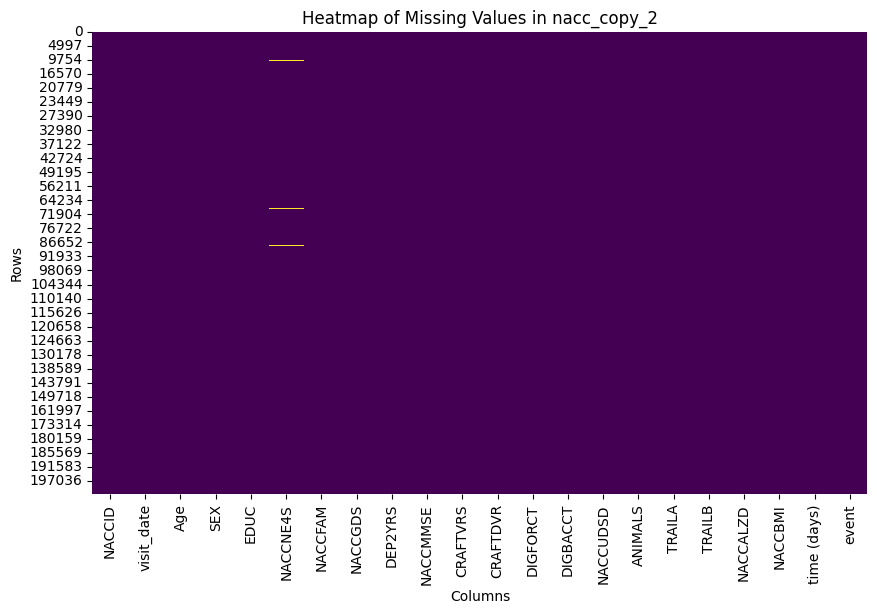

In [86]:
plt.figure(figsize=(10, 6))
sns.heatmap(nacc_copy_2.isnull(), cbar=False, cmap='viridis')
plt.title('Heatmap of Missing Values in nacc_copy_2')
plt.xlabel('Columns')
plt.ylabel('Rows')
plt.show()

# Drop null values

In [87]:
# Identify the NACCIDs that have missing values in 'NACCNE4S' in nacc_copy_2
naccids_to_drop = nacc_copy_2[nacc_copy_2['NACCNE4S'].isnull()]['NACCID']

# Drop rows with missing values in nacc_copy_2 based on 'NACCNE4S'
nacc_copy_2.dropna(subset=['NACCNE4S'], inplace=True)

# Verify that there are no more missing values in nacc_copy_2
print("Missing values in nacc_copy_2 after dropping rows:")
display(nacc_copy_2.isnull().sum())

Missing values in nacc_copy_2 after dropping rows:


,0
NACCID,0
visit_date,0
Age,0
SEX,0
EDUC,0
NACCNE4S,0
NACCFAM,0
NACCGDS,0
DEP2YRS,0
NACCMMSE,0


In [88]:
nacc_copy_2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12610 entries, 0 to 201348
Data columns (total 22 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   NACCID       12610 non-null  object        
 1   visit_date   12610 non-null  datetime64[ns]
 2   Age          12610 non-null  float64       
 3   SEX          12610 non-null  int64         
 4   EDUC         12610 non-null  int64         
 5   NACCNE4S     12610 non-null  float64       
 6   NACCFAM      12610 non-null  int64         
 7   NACCGDS      12610 non-null  int64         
 8   DEP2YRS      12610 non-null  int64         
 9   NACCMMSE     12610 non-null  int64         
 10  CRAFTVRS     12610 non-null  int64         
 11  CRAFTDVR     12610 non-null  int64         
 12  DIGFORCT     12610 non-null  int64         
 13  DIGBACCT     12610 non-null  int64         
 14  NACCUDSD     12610 non-null  int64         
 15  ANIMALS      12610 non-null  int64         
 16  TRAILA  

Generate histograms for each numerical column in `nacc_copy` to visualize their distribution and identify potential outliers.

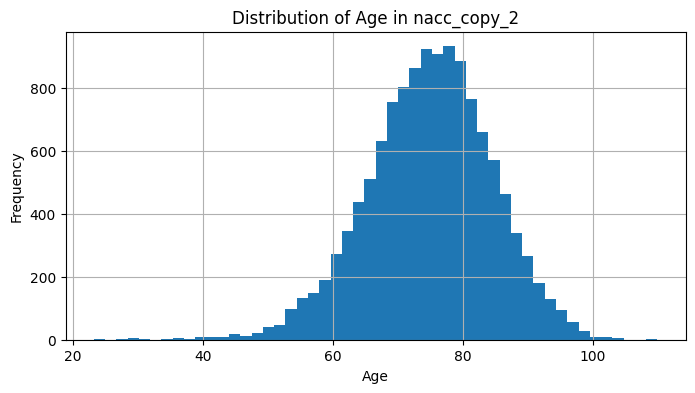

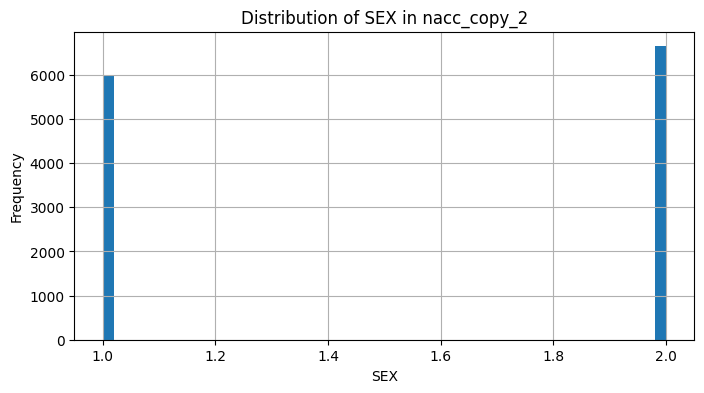

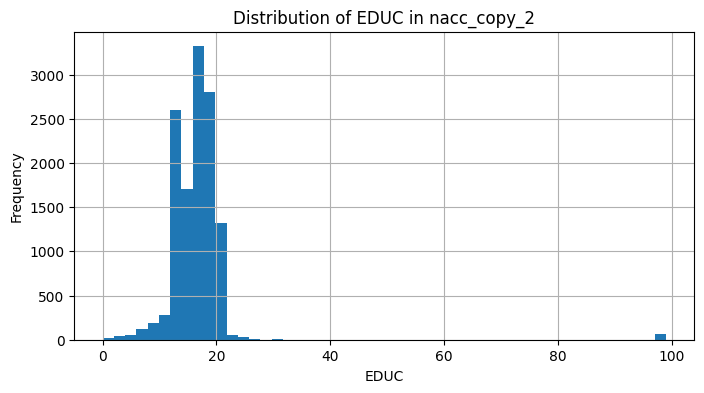

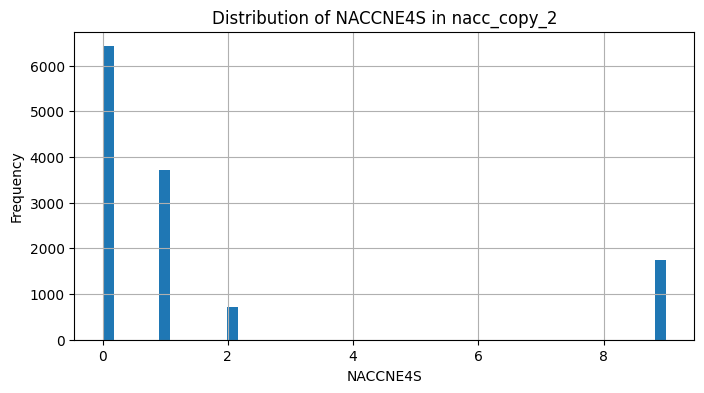

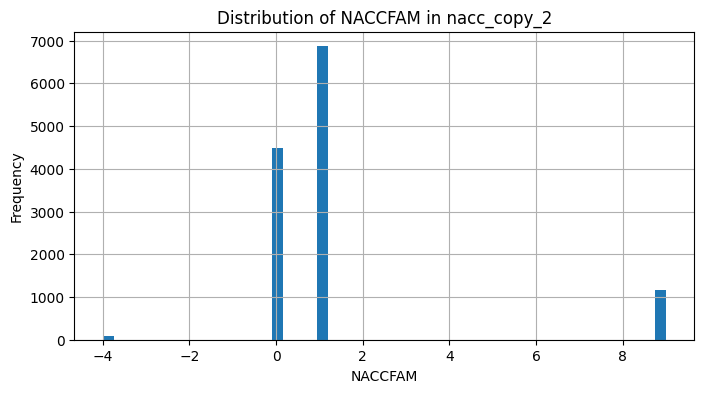

...

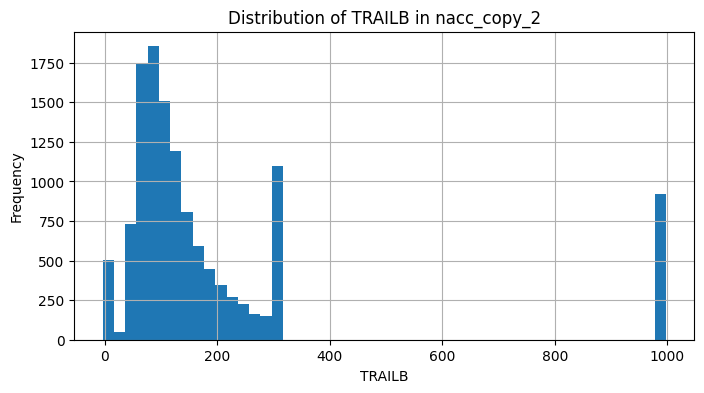

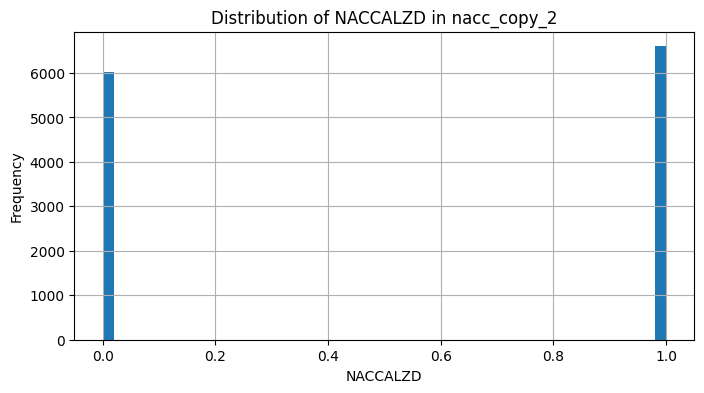

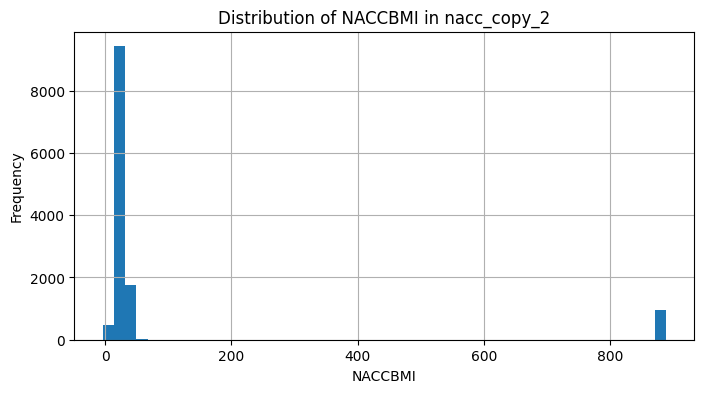

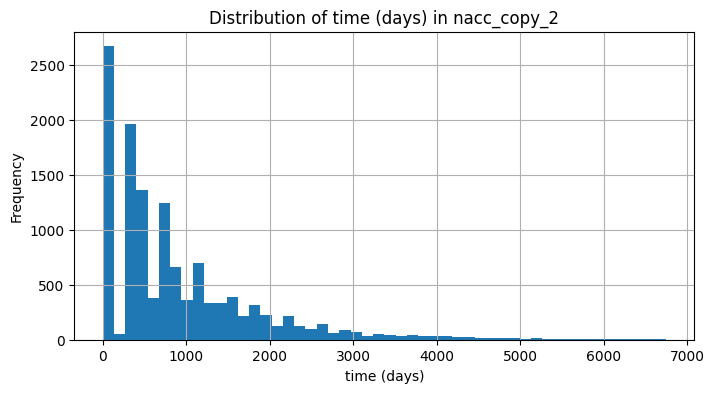

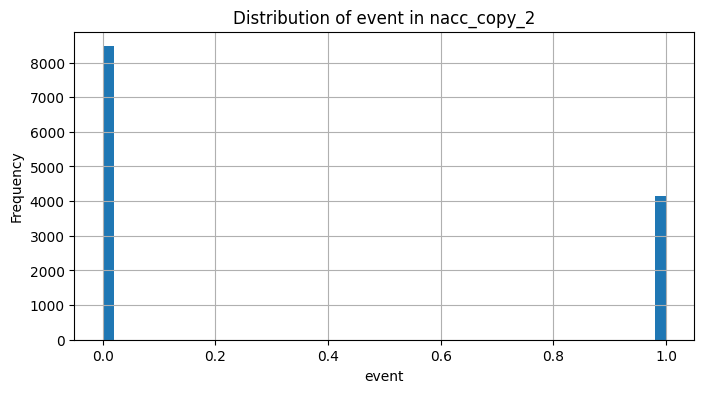

In [89]:
# Select numerical columns (excluding 'NACCID' as treated as identifier)
numerical_cols_nacc = nacc_copy_2.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Remove 'NACCID' as it exists and is not a numerical feature for outlier detection
if 'NACCID' in numerical_cols_nacc:
    numerical_cols_nacc.remove('NACCID')

# Create histograms for each numerical column
for col in numerical_cols_nacc:
    plt.figure(figsize=(8, 4))
    nacc_copy_2[col].hist(bins=50)
    plt.title(f'Distribution of {col} in nacc_copy_2')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [90]:
nacc_copy_2

,NACCID,visit_date,Age,SEX,EDUC,NACCNE4S,NACCFAM,NACCGDS,DEP2YRS,NACCMMSE,...,DIGFORCT,DIGBACCT,NACCUDSD,ANIMALS,TRAILA,TRAILB,NACCALZD,NACCBMI,time (days),event
0,NACC002909,2022-12-28,70.658453,1,16,1.0,1,4,0,-4,...,8,5,3,13,51,87,1,32.4,391.0,0
44,NACC063570,2022-08-02,82.584531,1,14,0.0,0,4,0,-4,...,9,4,3,17,45,213,0,28.4,756.0,0
51,NACC069522,2022-09-22,92.394251,2,14,1.0,1,2,0,-4,...,9,9,3,20,42,216,0,888.8,389.0,1
62,NACC086622,2022-03-28,71.739904,2,16,2.0,1,0,0,-4,...,4,8,3,23,51,88,1,18.0,756.0,1
64,NACC086775,2022-05-13,82.696783,2,14,0.0,0,1,0,-4,...,6,7,3,16,34,161,1,34.8,860.0,0
67,NACC088000,2023-05-15,81.869952,1,7,1.0,1,2,1,-4,...,4,2,3,14,39,997,1,32.0,392.0,0
69,NACC088316,2022-10-24,69.396304,2,9,0.0,0,0,1,-4,...,4,5,3,18,26,113,1,33.1,0.0,0
102,NACC122616,2023-11-09,83.523614,1,18,9.0,0,4,-4,-4,...,6,4,3,8,58,240,1,30.4,0.0,0
104,NACC126237,2022-08-15,86.121834,1,14,1.0,9,2,0,-4,...,5,5,3,14,51,245,1,31.3,582.0,1
115,NACC134941,2023-09-08,60.271047,1,16,0.0,1,2,0,-4,...,9,7,3,15,29,102,0,28.3,361.0,0


# if the participants are not follwed-up till 3 years and didn't convert to AD,  we need to exclude them from the dataset to avoid introducing bias.

In [91]:
# Condition: 'event' is 0 and 'time (days)' is less than 1000
condition_to_remove = (nacc_copy_2['event'] == 0) & (nacc_copy_2['time (days)'] < 1000)

# Remove rows that meet the condition
nacc_copy_2 = nacc_copy_2[~condition_to_remove].copy()

# Display the info of the modified DataFrame to confirm the number of rows
print("Info of nacc_copy_2 after filtering:")
nacc_copy_2.info()

# Display the first few rows of the modified DataFrame
print("\nFirst few rows of nacc_copy_2 after filtering:")
display(nacc_copy_2.head())

Info of nacc_copy_2 after filtering:
<class 'pandas.core.frame.DataFrame'>
Index: 6690 entries, 51 to 201348
Data columns (total 22 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   NACCID       6690 non-null   object        
 1   visit_date   6690 non-null   datetime64[ns]
 2   Age          6690 non-null   float64       
 3   SEX          6690 non-null   int64         
 4   EDUC         6690 non-null   int64         
 5   NACCNE4S     6690 non-null   float64       
 6   NACCFAM      6690 non-null   int64         
 7   NACCGDS      6690 non-null   int64         
 8   DEP2YRS      6690 non-null   int64         
 9   NACCMMSE     6690 non-null   int64         
 10  CRAFTVRS     6690 non-null   int64         
 11  CRAFTDVR     6690 non-null   int64         
 12  DIGFORCT     6690 non-null   int64         
 13  DIGBACCT     6690 non-null   int64         
 14  NACCUDSD     6690 non-null   int64         
 15  ANIMALS      6690 no

,NACCID,visit_date,Age,SEX,EDUC,NACCNE4S,NACCFAM,NACCGDS,DEP2YRS,NACCMMSE,...,DIGFORCT,DIGBACCT,NACCUDSD,ANIMALS,TRAILA,TRAILB,NACCALZD,NACCBMI,time (days),event
51,NACC069522,2022-09-22,92.394251,2,14,1.0,1,2,0,-4,...,9,9,3,20,42,216,0,888.8,389.0,1
62,NACC086622,2022-03-28,71.739904,2,16,2.0,1,0,0,-4,...,4,8,3,23,51,88,1,18.0,756.0,1
104,NACC126237,2022-08-15,86.121834,1,14,1.0,9,2,0,-4,...,5,5,3,14,51,245,1,31.3,582.0,1
170,NACC174929,2022-08-15,85.952088,2,12,0.0,1,1,0,-4,...,7,2,3,17,107,237,1,21.5,582.0,1
194,NACC188799,2022-02-07,78.354552,2,14,9.0,1,0,0,-4,...,7,7,3,13,36,111,0,24.5,743.0,1


# Drop the features which are not going to impact the ML model

In [92]:
nacc_copy_2 = nacc_copy_2.drop(columns=['visit_date', 'NACCUDSD', 'NACCALZD'], axis=1)

In [93]:
nacc_copy_2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6690 entries, 51 to 201348
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   NACCID       6690 non-null   object 
 1   Age          6690 non-null   float64
 2   SEX          6690 non-null   int64  
 3   EDUC         6690 non-null   int64  
 4   NACCNE4S     6690 non-null   float64
 5   NACCFAM      6690 non-null   int64  
 6   NACCGDS      6690 non-null   int64  
 7   DEP2YRS      6690 non-null   int64  
 8   NACCMMSE     6690 non-null   int64  
 9   CRAFTVRS     6690 non-null   int64  
 10  CRAFTDVR     6690 non-null   int64  
 11  DIGFORCT     6690 non-null   int64  
 12  DIGBACCT     6690 non-null   int64  
 13  ANIMALS      6690 non-null   int64  
 14  TRAILA       6690 non-null   int64  
 15  TRAILB       6690 non-null   int64  
 16  NACCBMI      6690 non-null   float64
 17  time (days)  6690 non-null   float64
 18  event        6690 non-null   int64  
dtypes: float

# Create new feature named - "event (1000 days)": target column for our project

In [94]:
# Create the new column 'event (1000 days)'
nacc_copy_2['event (1000 days)'] = 0  # Initialize with 0

# Apply the conditions
nacc_copy_2.loc[(nacc_copy_2['event'] == 1) & (nacc_copy_2['time (days)'] <= 1000), 'event (1000 days)'] = 1

# Display the first few rows with the new column
print("nacc_copy_2 with 'event (1000 days)' column:")
display(nacc_copy_2.head())

# Display the value counts for the new column
print("\nValue counts for the 'event (1000 days)' column:")
display(nacc_copy_2['event (1000 days)'].value_counts())

nacc_copy_2 with 'event (1000 days)' column:


,NACCID,Age,SEX,EDUC,NACCNE4S,NACCFAM,NACCGDS,DEP2YRS,NACCMMSE,CRAFTVRS,CRAFTDVR,DIGFORCT,DIGBACCT,ANIMALS,TRAILA,TRAILB,NACCBMI,time (days),event,event (1000 days)
51,NACC069522,92.394251,2,14,1.0,1,2,0,-4,7,1,9,9,20,42,216,888.8,389.0,1,1
62,NACC086622,71.739904,2,16,2.0,1,0,0,-4,4,0,4,8,23,51,88,18.0,756.0,1,1
104,NACC126237,86.121834,1,14,1.0,9,2,0,-4,8,0,5,5,14,51,245,31.3,582.0,1,1
170,NACC174929,85.952088,2,12,0.0,1,1,0,-4,16,2,7,2,17,107,237,21.5,582.0,1,1
194,NACC188799,78.354552,2,14,9.0,1,0,0,-4,4,0,7,7,13,36,111,24.5,743.0,1,1



Value counts for the 'event (1000 days)' column:


,count
event (1000 days),
0,4161
1,2529


In [95]:
nacc_copy_2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6690 entries, 51 to 201348
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   NACCID             6690 non-null   object 
 1   Age                6690 non-null   float64
 2   SEX                6690 non-null   int64  
 3   EDUC               6690 non-null   int64  
 4   NACCNE4S           6690 non-null   float64
 5   NACCFAM            6690 non-null   int64  
 6   NACCGDS            6690 non-null   int64  
 7   DEP2YRS            6690 non-null   int64  
 8   NACCMMSE           6690 non-null   int64  
 9   CRAFTVRS           6690 non-null   int64  
 10  CRAFTDVR           6690 non-null   int64  
 11  DIGFORCT           6690 non-null   int64  
 12  DIGBACCT           6690 non-null   int64  
 13  ANIMALS            6690 non-null   int64  
 14  TRAILA             6690 non-null   int64  
 15  TRAILB             6690 non-null   int64  
 16  NACCBMI            6690 no

In [96]:
nacc_copy_2 = nacc_copy_2.drop(columns=['event'], axis=1)

In [97]:
nacc_copy_2 = nacc_copy_2.drop(columns=['NACCID', 'time (days)', 'NACCGDS'], axis=1)

In [98]:
nacc_copy_2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6690 entries, 51 to 201348
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Age                6690 non-null   float64
 1   SEX                6690 non-null   int64  
 2   EDUC               6690 non-null   int64  
 3   NACCNE4S           6690 non-null   float64
 4   NACCFAM            6690 non-null   int64  
 5   DEP2YRS            6690 non-null   int64  
 6   NACCMMSE           6690 non-null   int64  
 7   CRAFTVRS           6690 non-null   int64  
 8   CRAFTDVR           6690 non-null   int64  
 9   DIGFORCT           6690 non-null   int64  
 10  DIGBACCT           6690 non-null   int64  
 11  ANIMALS            6690 non-null   int64  
 12  TRAILA             6690 non-null   int64  
 13  TRAILB             6690 non-null   int64  
 14  NACCBMI            6690 non-null   float64
 15  event (1000 days)  6690 non-null   int64  
dtypes: float64(3), int64(13)
m

In [99]:
nacc_copy_2.head()

,Age,SEX,EDUC,NACCNE4S,NACCFAM,DEP2YRS,NACCMMSE,CRAFTVRS,CRAFTDVR,DIGFORCT,DIGBACCT,ANIMALS,TRAILA,TRAILB,NACCBMI,event (1000 days)
51,92.394251,2,14,1.0,1,0,-4,7,1,9,9,20,42,216,888.8,1
62,71.739904,2,16,2.0,1,0,-4,4,0,4,8,23,51,88,18.0,1
104,86.121834,1,14,1.0,9,0,-4,8,0,5,5,14,51,245,31.3,1
170,85.952088,2,12,0.0,1,0,-4,16,2,7,2,17,107,237,21.5,1
194,78.354552,2,14,9.0,1,0,-4,4,0,7,7,13,36,111,24.5,1


In [100]:
# # Download the DataFrame as a CSV file
# nacc_copy_2.to_csv("final_cleaned_data.csv", index=False)

In [101]:
# 1) Average of craftDVR & CRAFTVRS
nacc_copy_2["avg_craft"] = nacc_copy_2[["CRAFTDVR", "CRAFTVRS"]].mean(axis=1)

# 2) Average of TRAILA & TRAILB
nacc_copy_2["avg_TRAIL"] = nacc_copy_2[["TRAILA", "TRAILB"]].mean(axis=1)

# 3) Average of DIGIBACCT & DIGIFORCT
nacc_copy_2["avg_DIGI"] = nacc_copy_2[["DIGBACCT", "DIGFORCT"]].mean(axis=1)

# Delete the original 6 columns
final_cleaned_data = nacc_copy_2.drop(columns=["CRAFTDVR", "CRAFTVRS", "TRAILA", "TRAILB", "DIGBACCT", "DIGFORCT"], axis=1).copy()


In [102]:
final_cleaned_data.head()

,Age,SEX,EDUC,NACCNE4S,NACCFAM,DEP2YRS,NACCMMSE,ANIMALS,NACCBMI,event (1000 days),avg_craft,avg_TRAIL,avg_DIGI
51,92.394251,2,14,1.0,1,0,-4,20,888.8,1,4.0,129.0,9.0
62,71.739904,2,16,2.0,1,0,-4,23,18.0,1,2.0,69.5,6.0
104,86.121834,1,14,1.0,9,0,-4,14,31.3,1,4.0,148.0,5.0
170,85.952088,2,12,0.0,1,0,-4,17,21.5,1,9.0,172.0,4.5
194,78.354552,2,14,9.0,1,0,-4,13,24.5,1,2.0,73.5,7.0


In [103]:
final_cleaned_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6690 entries, 51 to 201348
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Age                6690 non-null   float64
 1   SEX                6690 non-null   int64  
 2   EDUC               6690 non-null   int64  
 3   NACCNE4S           6690 non-null   float64
 4   NACCFAM            6690 non-null   int64  
 5   DEP2YRS            6690 non-null   int64  
 6   NACCMMSE           6690 non-null   int64  
 7   ANIMALS            6690 non-null   int64  
 8   NACCBMI            6690 non-null   float64
 9   event (1000 days)  6690 non-null   int64  
 10  avg_craft          6690 non-null   float64
 11  avg_TRAIL          6690 non-null   float64
 12  avg_DIGI           6690 non-null   float64
dtypes: float64(6), int64(7)
memory usage: 731.7 KB


In [104]:
# Move 'event (1000 days)' to the last column
col = final_cleaned_data.pop("event (1000 days)")
final_cleaned_data["event (1000 days)"] = col

In [105]:
final_cleaned_data.head()

,Age,SEX,EDUC,NACCNE4S,NACCFAM,DEP2YRS,NACCMMSE,ANIMALS,NACCBMI,avg_craft,avg_TRAIL,avg_DIGI,event (1000 days)
51,92.394251,2,14,1.0,1,0,-4,20,888.8,4.0,129.0,9.0,1
62,71.739904,2,16,2.0,1,0,-4,23,18.0,2.0,69.5,6.0,1
104,86.121834,1,14,1.0,9,0,-4,14,31.3,4.0,148.0,5.0,1
170,85.952088,2,12,0.0,1,0,-4,17,21.5,9.0,172.0,4.5,1
194,78.354552,2,14,9.0,1,0,-4,13,24.5,2.0,73.5,7.0,1


In [106]:
final_cleaned_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6690 entries, 51 to 201348
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Age                6690 non-null   float64
 1   SEX                6690 non-null   int64  
 2   EDUC               6690 non-null   int64  
 3   NACCNE4S           6690 non-null   float64
 4   NACCFAM            6690 non-null   int64  
 5   DEP2YRS            6690 non-null   int64  
 6   NACCMMSE           6690 non-null   int64  
 7   ANIMALS            6690 non-null   int64  
 8   NACCBMI            6690 non-null   float64
 9   avg_craft          6690 non-null   float64
 10  avg_TRAIL          6690 non-null   float64
 11  avg_DIGI           6690 non-null   float64
 12  event (1000 days)  6690 non-null   int64  
dtypes: float64(6), int64(7)
memory usage: 731.7 KB


In [107]:
# Download the DataFrame as a CSV file
final_cleaned_data.to_csv("final_cleaned_data.csv", index=False)